# Семинар 1 · kNN: близость, валидация и устойчивость

**Формат:** управляемая демонстрация на 90 минут — сначала прогноз аудитории, затем запуск клетки и объяснение результата.

К концу семинара студент сможет:

- восстановить предсказание k ближайших соседей по таблице расстояний;
- объяснить, как число соседей, масштаб признаков и функция расстояния меняют ответ;
- отличить расстояние внутри алгоритма, loss отдельного предсказания и метрику качества;
- выбрать гиперпараметр только по validation/CV и один раз оценить итог на test;
- увидеть неустойчивость решения к отдельной точке и к конкретному разбиению данных;
- распознать утечку через preprocessing, почти дубликаты, группы и время.

> Главный вопрос семинара: **что именно мы считаем похожим — и на каких данных имеем право проверять это предположение?**

## Ритм занятия

| Время | Блок | Действие аудитории |
|---:|---|---|
| 0–20 мин | Механика kNN | назвать соседей и предсказать класс до запуска |
| 20–35 мин | Масштаб и расстояние | объяснить, почему тот же объект получил другой ответ |
| 35–50 мин | Устойчивость | предсказать, какая часть границы изменится без одной точки |
| 50–70 мин | Validation и CV | выбрать `k`, не заглядывая в test |
| 70–83 мин | Leakage | найти нарушение в трёх схемах проверки |
| 83–90 мин | Итоги | сформулировать один обязательный вопрос к данным |

Правило для каждой демонстрации: **30 секунд подумать → проголосовать → обсудить в паре → запустить → объяснить**.

Блоки «YSDA riddle» и «размерность» в конце — резерв, если аудитория идёт быстро.

In [1]:
# Если Bokeh или Plotly отсутствуют в новом окружении/Colab,
# раскомментируйте и один раз выполните следующую строку:
# %pip install -q bokeh plotly

In [2]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn

from IPython.display import display
from matplotlib.colors import ListedColormap
from sklearn.datasets import load_digits
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score
from sklearn.model_selection import (
    GridSearchCV,
    StratifiedKFold,
    cross_val_score,
    train_test_split,
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC

warnings.filterwarnings("ignore", category=FutureWarning)

SEED = 42
rng = np.random.default_rng(SEED)
np.random.seed(SEED)

COLORS = {"A": "#F2994A", "B": "#2F80ED"}
REGION_CMAP = ListedColormap(["#FDE3C8", "#D8E9FF"])

plt.rcParams.update(
    {
        "figure.figsize": (10, 6),
        "figure.dpi": 110,
        "axes.grid": True,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "font.size": 12,
    }
)

print(f"Python scientific stack ready · scikit-learn {sklearn.__version__}")

Python scientific stack ready · scikit-learn 1.9.0


## 0. Карта задачи из лекции

$$
\mathcal D_{train}
\xrightarrow[\text{признаки, масштаб, расстояние, }K]{\text{kNN}}
\widehat y
\xrightarrow[\text{выбор настроек}]{\mathcal D_{val}\;\text{или CV}}
\text{final pipeline}
\xrightarrow[\text{один раз}]{\mathcal D_{test}}
Q_{final}
$$

Не смешиваем три разных объекта:

- **расстояние** $d(\mathbf x, \mathbf z)$ сравнивает два объекта и определяет соседей;
- **loss** $\ell(y, \widehat y)$ задаёт цену одной ошибки;
- **метрика качества** $Q$ агрегирует качество на выборке.

Для kNN «обучить модель» означает сохранить train-объекты. Однако выбор признаков, масштаба, расстояния и $K$ уже является частью модели и должен проверяться честно.

## 1. Один и тот же маленький мир

Используем те же точки, что и в сегодняшней лекции/интерактивной демонстрации. Оси пока называются `x1` и `x2`: смысл признаков не должен подменять геометрию красивой историей.

In [3]:
training = pd.DataFrame(
    [
        ("A1", 1.0, 1.0, "A"),
        ("A2", 1.0, 3.0, "A"),
        ("A3", 2.0, 2.0, "A"),
        ("A4", 2.0, 4.0, "A"),
        ("A5", 3.0, 1.0, "A"),
        ("B1", 5.0, 5.0, "B"),
        ("B2", 5.0, 7.0, "B"),
        ("B3", 6.0, 6.0, "B"),
        ("B4", 7.0, 5.0, "B"),
        ("B5", 7.0, 7.0, "B"),
        ("B0", 3.1, 2.2, "B"),  # одиночный выброс среди A
    ],
    columns=["id", "x1", "x2", "label"],
)

validation = pd.DataFrame(
    [
        ("V1", 2.5, 2.2, "A"),
        ("V2", 3.0, 2.2, "A"),
        ("V3", 5.5, 5.5, "B"),
        ("V4", 6.5, 6.0, "B"),
        ("V5", 4.2, 4.0, "B"),
    ],
    columns=["id", "x1", "x2", "label"],
)

queries = {
    "outlier": np.array([3.0, 2.2]),
    "scale": np.array([4.0, 4.0]),
    "metric": np.array([3.1, 5.0]),
}

display(training)

,id,x1,x2,label
0,A1,1.0,1.0,A
1,A2,1.0,3.0,A
2,A3,2.0,2.0,A
3,A4,2.0,4.0,A
4,A5,3.0,1.0,A
5,B1,5.0,5.0,B
6,B2,5.0,7.0,B
7,B3,6.0,6.0,B
8,B4,7.0,5.0,B
9,B5,7.0,7.0,B


In [4]:
def distances_to_query(points, query, metric="euclidean", scale=(1.0, 1.0)):
    delta = (points[["x1", "x2"]].to_numpy() - np.asarray(query)) * np.asarray(scale)
    if metric == "euclidean":
        return np.sqrt((delta**2).sum(axis=1))
    if metric == "manhattan":
        return np.abs(delta).sum(axis=1)
    raise ValueError("metric must be 'euclidean' or 'manhattan'")


def neighbor_table(points, query, k=3, metric="euclidean", scale=(1.0, 1.0)):
    table = points.copy()
    table["distance"] = distances_to_query(points, query, metric=metric, scale=scale)
    table = table.sort_values(["distance", "id"]).reset_index(drop=True)
    table["neighbor"] = np.arange(1, len(table) + 1) <= k
    return table


def predict_query(points, query, k=3, metric="euclidean", scale=(1.0, 1.0)):
    nearest = neighbor_table(points, query, k=k, metric=metric, scale=scale).head(k)
    counts = nearest["label"].value_counts()
    winners = set(counts[counts == counts.max()].index)
    # При ничьей выбираем класс ближайшего среди победителей — правило задано явно.
    prediction = nearest.loc[nearest["label"].isin(winners), "label"].iloc[0]
    return prediction, nearest


def plot_neighbors(
    ax,
    points,
    query,
    k,
    metric="euclidean",
    scale=(1.0, 1.0),
    title=None,
    transform_coordinates=False,
):
    prediction, nearest = predict_query(points, query, k=k, metric=metric, scale=scale)
    display_scale = np.asarray(scale) if transform_coordinates else np.ones(2)
    for label, group in points.groupby("label"):
        ax.scatter(
            group.x1 * display_scale[0],
            group.x2 * display_scale[1],
            s=120,
            color=COLORS[label],
            edgecolor="white",
            linewidth=1.2,
            label=f"class {label}",
            zorder=3,
        )
    for row in points.itertuples():
        displayed_point = np.array([row.x1, row.x2]) * display_scale
        ax.annotate(row.id, displayed_point, xytext=(5, 5), textcoords="offset points", fontsize=9)
    displayed_query = np.asarray(query) * display_scale
    ax.scatter(*displayed_query, marker="D", s=170, color="white", edgecolor="black", linewidth=2, zorder=5)
    ax.annotate("Q", displayed_query, xytext=(7, -16), textcoords="offset points", weight="bold")
    for row in nearest.itertuples():
        displayed_neighbor = np.array([row.x1, row.x2]) * display_scale
        ax.plot(
            [displayed_query[0], displayed_neighbor[0]],
            [displayed_query[1], displayed_neighbor[1]],
            color="#333333",
            alpha=0.55,
            zorder=2,
        )
    ax.set(
        xlim=(0, 8 * display_scale[0]),
        ylim=(0, 8 * display_scale[1]),
        xlabel="x1" if display_scale[0] == 1 else f"{display_scale[0]:g} · x1",
        ylabel="x2" if display_scale[1] == 1 else f"x2′ = {display_scale[1]:g} · x2",
    )
    ax.set_xticks(np.arange(0, 8 * display_scale[0] + 0.1, display_scale[0]))
    ax.set_yticks(np.arange(0, 8 * display_scale[1] + 0.1, display_scale[1]))
    if transform_coordinates and display_scale[1] > 1:
        ax.set_yticks(np.arange(0, 8 * display_scale[1] + 0.1, 1), minor=True)
        ax.grid(which="minor", alpha=0.14, linewidth=0.6)
        ax.grid(which="major", alpha=0.45, linewidth=1.0)
    ax.set_aspect("equal")
    ax.set_title(title or f"k={k} → class {prediction}")
    return prediction, nearest

### Эксперимент 1. Одна точка решает всё?

Запрос `Q = (3.0, 2.2)` на самом деле относится к классу A.

**До запуска:**

1. Какой объект ближайший?
2. Какой ответ даст `k=1`?
3. Изменится ли ответ при `k=3`? Назовите трёх соседей.

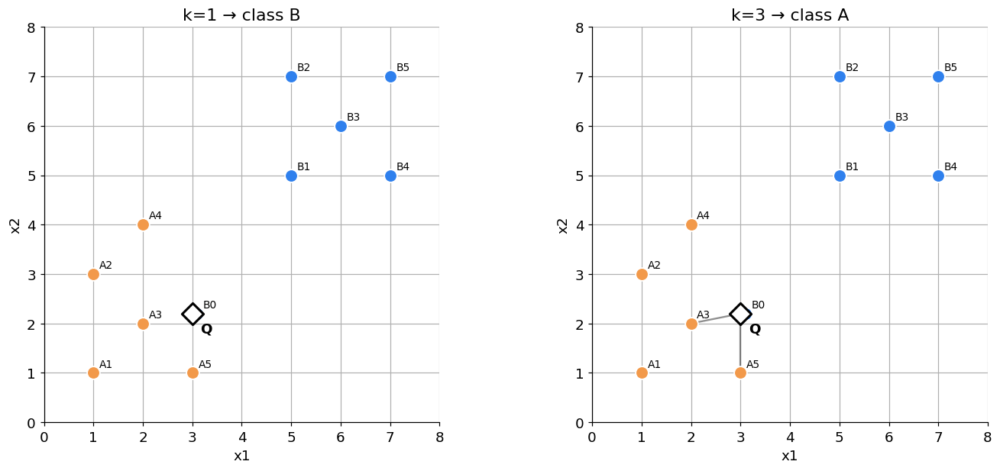

,k,prediction,neighbors,votes
0,1,B,B0,{'B': 1}
1,3,A,"B0, A3, A5","{'A': 2, 'B': 1}"


,id,x1,x2,label,distance,neighbor
0,B0,3.1,2.2,B,0.100,True
1,A3,2.0,2.0,A,1.020,True
2,A5,3.0,1.0,A,1.200,True
3,A4,2.0,4.0,A,2.059,False
4,A2,1.0,3.0,A,2.154,False


In [5]:
query = queries["outlier"]
fig, axes = plt.subplots(1, 2, figsize=(13, 5.5), constrained_layout=True)
summaries = []

for ax, k in zip(axes, [1, 3]):
    prediction, nearest = plot_neighbors(ax, training, query, k=k)
    summaries.append(
        {
            "k": k,
            "prediction": prediction,
            "neighbors": ", ".join(nearest.id),
            "votes": dict(nearest.label.value_counts()),
        }
    )

plt.show()
display(pd.DataFrame(summaries))
display(neighbor_table(training, query, k=3).head(5).round({"distance": 3}))

assert [row["prediction"] for row in summaries] == ["B", "A"]

<details>
<summary><b>Разбор</b></summary>

При `k=1` выброс `B0` находится на расстоянии `0.1` и целиком определяет неправильный ответ B. При `k=3` следующими идут две точки A, поэтому голосование `A:B = 2:1` возвращает A.

Малое `k` даёт гибкое, но чувствительное локальное правило. Большее `k` сглаживает одиночный шум, но может стереть настоящий маленький класс. Универсально лучшего `k` нет.
</details>

### Эксперимент 2. Масштаб — это изменение геометрии

**До запуска:**

Запрос теперь стоит точно в узле сетки: $Q=(4,4)$.

1. В исходных координатах сравните кандидатов $A4=(2,4)$ и $B1=(5,5)$.
2. Затем замените второй признак на $x'_2=3x_2$. Все значения второй координаты, включая координату запроса, действительно умножаются на 3: $Q'=(4,12)$.
3. Предскажите, кто окажется ближе после преобразования.

На втором графике крупные горизонтальные линии соответствуют одному старому шагу `x2`, то есть трём новым единицам. Тонкая сетка показывает каждый шаг новой шкалы.

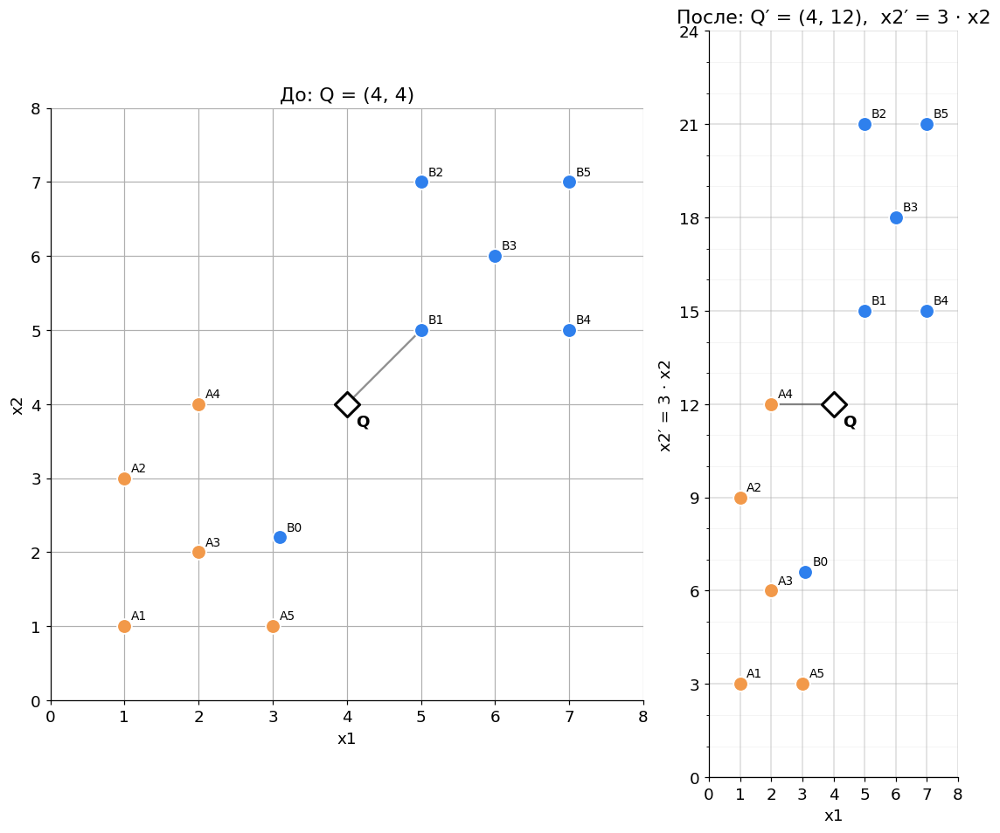

,coordinates,Q,A4,distance to A4,B1,distance to B1,nearest,prediction
0,"(x1, x2)","(4, 4)","(2, 4)",2.0,"(5, 5)",1.414,B1,B
1,"(x1, 3·x2)","(4, 12)","(2, 12)",2.0,"(5, 15)",3.162,A4,A


In [6]:
SCALE_FACTOR = 3
query = queries["scale"]
scale_experiments = [
    ("До: Q = (4, 4)", (1, 1)),
    ("После: Q′ = (4, 12),  x2′ = 3 · x2", (1, SCALE_FACTOR)),
]

fig = plt.figure(figsize=(10, 9), constrained_layout=True)
grid = fig.add_gridspec(1, 2, width_ratios=[1.0, 0.42])
axes = [fig.add_subplot(grid[0, 0]), fig.add_subplot(grid[0, 1])]
scale_rows = []

for ax, (name, scale) in zip(axes, scale_experiments):
    prediction, nearest = plot_neighbors(
        ax,
        training,
        query,
        k=1,
        metric="euclidean",
        scale=scale,
        title=name,
        transform_coordinates=True,
    )
    a4_distance = neighbor_table(training, query, k=1, scale=scale).query("id == 'A4'").distance.iloc[0]
    b1_distance = neighbor_table(training, query, k=1, scale=scale).query("id == 'B1'").distance.iloc[0]
    scale_rows.append(
        {
            "coordinates": "(x1, x2)" if scale[1] == 1 else "(x1, 3·x2)",
            "Q": "(4, 4)" if scale[1] == 1 else "(4, 12)",
            "A4": "(2, 4)" if scale[1] == 1 else "(2, 12)",
            "distance to A4": a4_distance,
            "B1": "(5, 5)" if scale[1] == 1 else "(5, 15)",
            "distance to B1": b1_distance,
            "nearest": nearest.id.iloc[0],
            "prediction": prediction,
        }
    )

plt.show()
display(pd.DataFrame(scale_rows).round({"distance to A4": 3, "distance to B1": 3}))

assert [row["nearest"] for row in scale_rows] == ["B1", "A4"]
assert [row["prediction"] for row in scale_rows] == ["B", "A"]

### Эксперимент 2b. Другая функция расстояния — другая близость

Теперь координаты и масштаб не меняются. Для $Q=(3.1,5.0)$ сравниваем только Euclidean и Manhattan.

**До запуска:** может ли смениться ближайший объект без изменения точек и их единиц измерения?

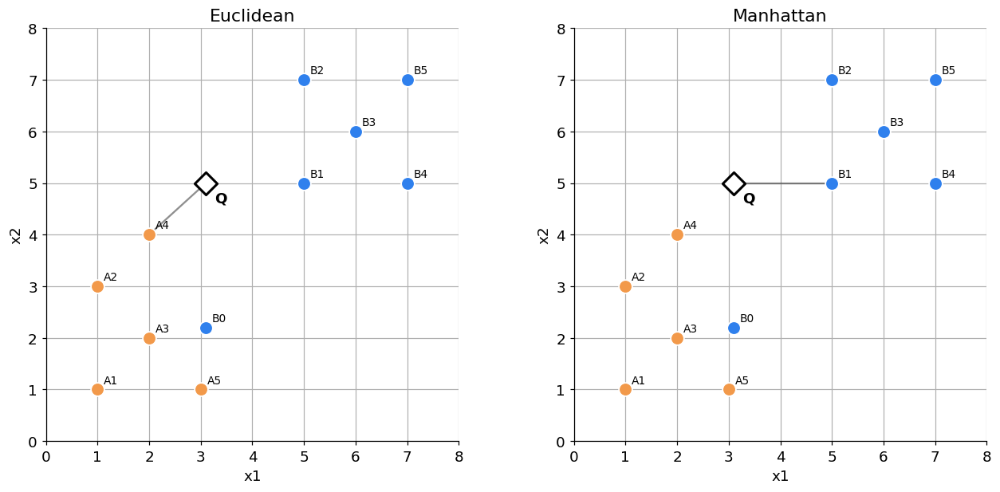

,distance,nearest,value,prediction
0,Euclidean,A4,1.487,A
1,Manhattan,B1,1.900,B


In [7]:
metric_experiments = [
    ("Euclidean", "euclidean"),
    ("Manhattan", "manhattan"),
]

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), constrained_layout=True)
metric_rows = []

for ax, (name, metric) in zip(axes, metric_experiments):
    prediction, nearest = plot_neighbors(
        ax, training, queries["metric"], k=1, metric=metric, title=name
    )
    metric_rows.append(
        {
            "distance": name,
            "nearest": nearest.id.iloc[0],
            "value": nearest.distance.iloc[0],
            "prediction": prediction,
        }
    )

plt.show()
display(pd.DataFrame(metric_rows).round({"value": 3}))

assert [row["nearest"] for row in metric_rows] == ["A4", "B1"]

<details>
<summary><b>Разбор</b></summary>

Масштабирование — не нейтральная косметика: оно меняет относительную важность координат в расстоянии. Статистики масштабирования нужно оценивать **только на train**, а затем применять к validation/test.

$$d_2(\mathbf x,\mathbf z)=\sqrt{\sum_j(x_j-z_j)^2},\qquad
d_1(\mathbf x,\mathbf z)=\sum_j|x_j-z_j|$$

Функция расстояния кодирует допустимую геометрию слова «похожий». Это не то же самое, что evaluation metric вроде accuracy.
</details>

### Интерактивная карта соседей · Bokeh

Это развитие знакомой визуализации из семинара по word2vec. Там точками будут слова, здесь — train-объекты.

- Перетащите белый ромб `Q` инструментом **Point Draw**.
- Меняйте `k` и Euclidean/Manhattan.
- Наведите курсор на объект, чтобы увидеть его ID, класс и текущее расстояние.
- Колесо мыши масштабирует график; серые линии показывают выбранных соседей.

**Вопрос аудитории:** может ли набор соседей поменяться, хотя точка запроса и train-объекты остались на местах?

In [8]:
from bokeh.io import output_notebook, show
from bokeh.layouts import column, row
from bokeh.models import ColumnDataSource, CustomJS, Div, HoverTool, PointDrawTool, Select, Slider
from bokeh.plotting import figure
from bokeh.resources import INLINE

output_notebook(resources=INLINE, hide_banner=True)

initial_query = queries["outlier"].copy()
initial_prediction, initial_neighbors = predict_query(training, initial_query, k=3)
initial_distances = distances_to_query(training, initial_query)
initial_neighbor_ids = set(initial_neighbors.id)

point_source = ColumnDataSource(
    {
        "x": training.x1.to_list(),
        "y": training.x2.to_list(),
        "id": training.id.to_list(),
        "label": training.label.to_list(),
        "color": training.label.map(COLORS).to_list(),
        "distance": initial_distances.tolist(),
        "size": [18 if item_id in initial_neighbor_ids else 11 for item_id in training.id],
        "alpha": [1.0 if item_id in initial_neighbor_ids else 0.55 for item_id in training.id],
    }
)
query_source = ColumnDataSource({"x": [initial_query[0]], "y": [initial_query[1]]})
segment_source = ColumnDataSource(
    {
        "x0": [initial_query[0]] * len(initial_neighbors),
        "y0": [initial_query[1]] * len(initial_neighbors),
        "x1": initial_neighbors.x1.to_list(),
        "y1": initial_neighbors.x2.to_list(),
    }
)

interactive_plot = figure(
    width=780,
    height=560,
    x_range=(0, 8),
    y_range=(0, 8),
    title=f"k=3 · Euclidean · prediction: {initial_prediction}",
    tools="pan,wheel_zoom,box_zoom,reset,save",
    active_scroll="wheel_zoom",
)
interactive_plot.xaxis.axis_label = "x1"
interactive_plot.yaxis.axis_label = "x2"
interactive_plot.grid.grid_line_alpha = 0.25

interactive_plot.segment(
    "x0", "y0", "x1", "y1", source=segment_source,
    line_color="#555555", line_alpha=0.55, line_width=2,
)
point_renderer = interactive_plot.scatter(
    "x", "y", source=point_source, size="size", fill_color="color", fill_alpha="alpha",
    line_color="white", line_width=1.5, marker="circle",
)
query_renderer = interactive_plot.scatter(
    "x", "y", source=query_source, size=22, fill_color="white", line_color="black",
    line_width=2.5, marker="diamond",
)

interactive_plot.add_tools(
    HoverTool(
        renderers=[point_renderer],
        tooltips=[("object", "@id"), ("class", "@label"), ("distance", "@distance{0.000}")],
    )
)
draw_tool = PointDrawTool(renderers=[query_renderer], add=False)
interactive_plot.add_tools(draw_tool)
interactive_plot.toolbar.active_drag = draw_tool

k_slider = Slider(start=1, end=9, value=3, step=2, title="number of neighbors k")
metric_select = Select(title="distance", value="euclidean", options=["euclidean", "manhattan"])
status = Div(
    text=f"<b>Prediction: {initial_prediction}</b> · neighbors: {', '.join(initial_neighbors.id)}",
    width=780,
    height=35,
)

callback = CustomJS(
    args={
        "points": point_source,
        "query": query_source,
        "segments": segment_source,
        "k_widget": k_slider,
        "metric_widget": metric_select,
        "status": status,
        "plot": interactive_plot,
    },
    code="""
        const qx = query.data.x[0];
        const qy = query.data.y[0];
        const k = k_widget.value;
        const metric = metric_widget.value;
        const xs = points.data.x;
        const ys = points.data.y;
        const labels = points.data.label;
        const ids = points.data.id;
        const distances = [];

        for (let i = 0; i < xs.length; i++) {
            const dx = xs[i] - qx;
            const dy = ys[i] - qy;
            distances.push(metric === "euclidean" ? Math.sqrt(dx * dx + dy * dy) : Math.abs(dx) + Math.abs(dy));
        }

        const order = Array.from(xs.keys()).sort((a, b) => distances[a] - distances[b] || ids[a].localeCompare(ids[b]));
        const chosen = order.slice(0, k);
        const chosenSet = new Set(chosen);
        const counts = {};
        for (const index of chosen) counts[labels[index]] = (counts[labels[index]] || 0) + 1;
        const maxVotes = Math.max(...Object.values(counts));
        let prediction = labels[chosen[0]];
        for (const index of chosen) {
            if (counts[labels[index]] === maxVotes) {
                prediction = labels[index];
                break;
            }
        }

        points.data.distance = distances;
        points.data.size = xs.map((_, i) => chosenSet.has(i) ? 18 : 11);
        points.data.alpha = xs.map((_, i) => chosenSet.has(i) ? 1.0 : 0.55);
        points.selected.indices = chosen;
        segments.data = {
            x0: chosen.map(() => qx),
            y0: chosen.map(() => qy),
            x1: chosen.map(i => xs[i]),
            y1: chosen.map(i => ys[i]),
        };

        const metricName = metric === "euclidean" ? "Euclidean" : "Manhattan";
        plot.title.text = `k=${k} · ${metricName} · prediction: ${prediction}`;
        status.text = `<b>Prediction: ${prediction}</b> · neighbors: ${chosen.map(i => ids[i]).join(", ")}`;
        points.change.emit();
        segments.change.emit();
    """,
)

for widget in (k_slider, metric_select):
    widget.js_on_change("value", callback)
query_source.js_on_change("data", callback)

show(column(row(k_slider, metric_select), interactive_plot, status))

## 2. Устойчивость решения

Сначала посмотрим, как `k` меняет границу решений. Затем удалим ровно одну точку — выброс `B0` — и измерим долю плоскости, на которой предсказание поменялось.

**До запуска:** расположите `k=1`, `k=3`, `k=7` от самой «рваной» границы к самой гладкой.

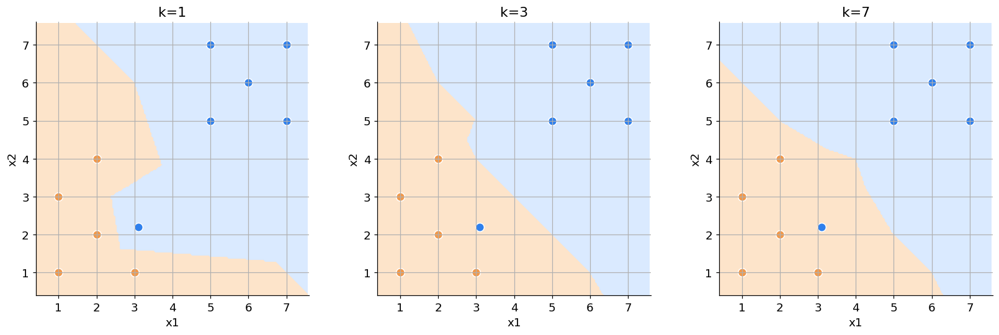

In [9]:
def mesh_for(points, step=0.04, border=0.6):
    x_min, x_max = points.x1.min() - border, points.x1.max() + border
    y_min, y_max = points.x2.min() - border, points.x2.max() + border
    xx, yy = np.meshgrid(
        np.arange(x_min, x_max, step),
        np.arange(y_min, y_max, step),
    )
    return xx, yy


def fit_and_grid_predict(points, k, xx, yy):
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(points[["x1", "x2"]].to_numpy(), points.label.to_numpy())
    labels = model.predict(np.c_[xx.ravel(), yy.ravel()])
    return (labels == "B").astype(int).reshape(xx.shape)


xx, yy = mesh_for(training)
fig, axes = plt.subplots(1, 3, figsize=(15, 4.8), constrained_layout=True)

for ax, k in zip(axes, [1, 3, 7]):
    zz = fit_and_grid_predict(training, k, xx, yy)
    ax.contourf(xx, yy, zz, levels=[-0.5, 0.5, 1.5], cmap=REGION_CMAP, alpha=0.95)
    for label, group in training.groupby("label"):
        ax.scatter(group.x1, group.x2, s=80, color=COLORS[label], edgecolor="white")
    ax.set(title=f"k={k}", xlabel="x1", ylabel="x2", xlim=(0.4, 7.6), ylim=(0.4, 7.6))
    ax.set_aspect("equal")

plt.show()

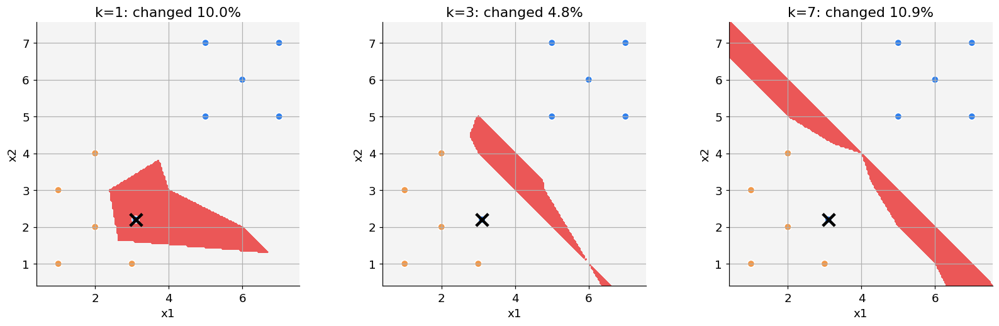

,k,share of grid changed
0,1,9.96%
1,3,4.76%
2,7,10.89%


In [10]:
without_outlier = training.query("id != 'B0'").copy()
stability_rows = []

fig, axes = plt.subplots(1, 3, figsize=(15, 4.6), constrained_layout=True)
for ax, k in zip(axes, [1, 3, 7]):
    pred_full = fit_and_grid_predict(training, k, xx, yy)
    pred_without = fit_and_grid_predict(without_outlier, k, xx, yy)
    changed = pred_full != pred_without
    changed_share = changed.mean()
    stability_rows.append({"k": k, "share of grid changed": changed_share})

    ax.contourf(xx, yy, changed.astype(int), levels=[-0.5, 0.5, 1.5], cmap=ListedColormap(["#F4F4F4", "#EB5757"]))
    ax.scatter(training.x1, training.x2, c=training.label.map(COLORS), s=55, edgecolor="white")
    b0 = training.query("id == 'B0'").iloc[0]
    ax.scatter(b0.x1, b0.x2, marker="x", s=160, linewidth=3, color="black")
    ax.set(title=f"k={k}: changed {changed_share:.1%}", xlabel="x1", ylabel="x2")
    ax.set_aspect("equal")

plt.show()
display(pd.DataFrame(stability_rows).style.format({"share of grid changed": "{:.2%}"}))

**Интерпретация устойчивости.** Красная область — запросы, для которых удаление одного наблюдения меняет ответ. Это не полный формальный анализ algorithmic stability, но наглядная операционализация вопроса: «насколько решение зависит от одной строки train?»

В этом примере `k=3` устойчивее и `k=1`, и `k=7`. Увеличение `k` часто сглаживает влияние отдельной точки, но **не гарантирует монотонного улучшения**: удаление объекта меняет и состав соседей, и локальные большинства. При слишком большом `k` решение всё сильнее зависит от глобального баланса классов и теряет локальную структуру. Поэтому устойчивость — часть компромисса, который нужно проверять на новых данных.

## 3. Train ≠ validation ≠ test

На тех же маленьких данных сравним `k ∈ {1, 3, 5}`.

**До запуска:** какое `k` победит, если смотреть только на train? Почему результат почти предопределён устройством 1-NN?

In [11]:
X_train_toy = training[["x1", "x2"]]
y_train_toy = training.label
X_val_toy = validation[["x1", "x2"]]
y_val_toy = validation.label

scores = []
for k in [1, 3, 5]:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train_toy, y_train_toy)
    scores.append(
        {
            "k": k,
            "train accuracy": model.score(X_train_toy, y_train_toy),
            "validation accuracy": model.score(X_val_toy, y_val_toy),
        }
    )

toy_scores = pd.DataFrame(scores)
display(toy_scores.style.format({"train accuracy": "{:.2f}", "validation accuracy": "{:.2f}"}))

assert np.allclose(toy_scores["validation accuracy"], [0.8, 1.0, 1.0])

,k,train accuracy,validation accuracy
0,1,1.00,0.80
1,3,0.91,1.00
2,5,0.91,1.00


<details>
<summary><b>Разбор</b></summary>

1-NN получает идеальный train score, потому что каждая train-точка является собственным ближайшим соседом — включая выброс. Validation предпочитает более сглаженное решение.

$$
\text{train строит решение}
\longrightarrow
\text{validation выбирает настройки}
\longrightarrow
\text{test один раз оценивает финал}
$$

После многократного сравнения моделей на validation его score уже нельзя честно объявить финальной оценкой: мы подстроились под этот набор.
</details>

## 4. Реальные данные: цифры 8×8

Теперь применим тот же pipeline к встроенному датасету `sklearn.datasets.load_digits`: 1797 изображений, каждое превращено в 64 признака-пикселя. Ничего скачивать не нужно.

Test отделяем **до** выбора `k` и не используем до последней клетки блока.

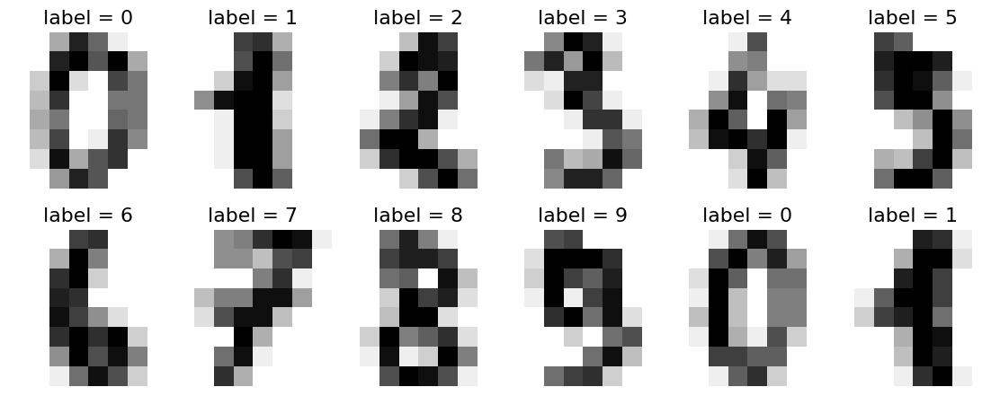

development: (1437, 64), untouched test: (360, 64)


In [12]:
digits = load_digits()
X, y = digits.data, digits.target

fig, axes = plt.subplots(2, 6, figsize=(10, 4), constrained_layout=True)
for ax, image, label in zip(axes.flat, digits.images[:12], y[:12]):
    ax.imshow(image, cmap="gray_r")
    ax.set_title(f"label = {label}")
    ax.axis("off")
plt.show()

X_dev, X_test, y_dev, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=SEED,
    stratify=y,
)

print(f"development: {X_dev.shape}, untouched test: {X_test.shape}")

### Необязательный мост: вращаемая 3D-проекция · Plotly

В positional encoding мы уже использовали `scatter_3d`. Здесь применяем ту же механику к цифрам: PCA сжимает 64 пиксельных признака до трёх координат для просмотра.

- Зажмите мышь и вращайте облако.
- Колесо меняет масштаб, hover показывает цифру и номер объекта.
- Ищите плотные острова и области смешения классов.

> Важно: это **проекция для визуализации**, а не пространство, в котором ниже обучается kNN. Модель продолжает использовать исходные 64 признака. Позже мы вернёмся к такому же приёму для word embeddings и positional encodings. Если времени мало, этот блок можно пропустить без потери основной линии.

In [13]:
import plotly.express as px
from sklearn.decomposition import PCA

visual_rng = np.random.default_rng(SEED)
visual_indices = np.sort(visual_rng.choice(len(X_dev), size=900, replace=False))
X_visual = StandardScaler().fit_transform(X_dev[visual_indices])
projection_3d = PCA(n_components=3, random_state=SEED).fit_transform(X_visual)

projection_frame = pd.DataFrame(
    {
        "PC1": projection_3d[:, 0],
        "PC2": projection_3d[:, 1],
        "PC3": projection_3d[:, 2],
        "digit": y_dev[visual_indices].astype(str),
        "sample": visual_indices,
    }
)

figure_3d = px.scatter_3d(
    projection_frame,
    x="PC1",
    y="PC2",
    z="PC3",
    color="digit",
    hover_data={"sample": True, "PC1": ":.2f", "PC2": ":.2f", "PC3": ":.2f"},
    color_discrete_sequence=px.colors.qualitative.D3,
    title="Digits: 64D → 3D PCA projection (visualization only)",
)
figure_3d.update_traces(marker={"size": 3.5, "opacity": 0.72})
figure_3d.update_layout(
    height=680,
    margin={"l": 0, "r": 0, "t": 55, "b": 0},
    legend_title_text="digit",
)
figure_3d.show(renderer="notebook")

### Выбор `k` внутри cross-validation

`StandardScaler` находится **внутри** `Pipeline`. Поэтому на каждом fold средние и масштабы вычисляются только по train-части этого fold, а не заранее по всем данным.

**До запуска:** где ожидаете максимальный train score? Совпадёт ли он с максимумом CV?

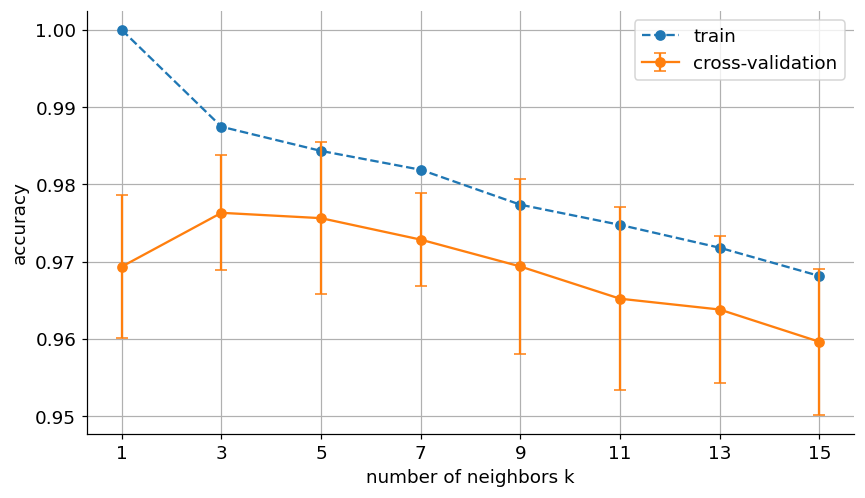

,k,train accuracy,CV accuracy,CV fold std
0,1,1.000,0.969,0.009
1,3,0.987,0.976,0.007
2,5,0.984,0.976,0.010
3,7,0.982,0.973,0.006
4,9,0.977,0.969,0.011
5,11,0.975,0.965,0.012
6,13,0.972,0.964,0.009
7,15,0.968,0.960,0.009


Selected only on development data: k = 3


In [14]:
candidate_k = list(range(1, 16, 2))
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

pipeline = Pipeline(
    [
        ("scale", StandardScaler()),
        ("knn", KNeighborsClassifier()),
    ]
)

search = GridSearchCV(
    pipeline,
    param_grid={"knn__n_neighbors": candidate_k},
    scoring="accuracy",
    cv=cv,
    return_train_score=True,
    n_jobs=-1,
)
search.fit(X_dev, y_dev)

cv_results = pd.DataFrame(search.cv_results_)[
    ["param_knn__n_neighbors", "mean_train_score", "mean_test_score", "std_test_score"]
].rename(
    columns={
        "param_knn__n_neighbors": "k",
        "mean_train_score": "train accuracy",
        "mean_test_score": "CV accuracy",
        "std_test_score": "CV fold std",
    }
)
cv_results["k"] = cv_results["k"].astype(int)

fig, ax = plt.subplots(figsize=(9, 5))
ax.plot(cv_results.k, cv_results["train accuracy"], "o--", label="train")
ax.errorbar(
    cv_results.k,
    cv_results["CV accuracy"],
    yerr=cv_results["CV fold std"],
    fmt="o-",
    capsize=4,
    label="cross-validation",
)
ax.set(xlabel="number of neighbors k", ylabel="accuracy", xticks=candidate_k)
ax.legend()
plt.show()

display(cv_results.style.format({"train accuracy": "{:.3f}", "CV accuracy": "{:.3f}", "CV fold std": "{:.3f}"}))
print(f"Selected only on development data: k = {search.best_params_['knn__n_neighbors']}")

### Другой вопрос: стабилен ли победитель?

**Предыдущий график** сравнивал разные `k` при одной зафиксированной схеме из пяти folds и выбрал победителя.

**Этот блок** повторяет весь выбор при шести других корректных разбиениях на folds. Цвет клетки — средняя CV accuracy, звезда — победитель строки. Мы проверяем не качество ещё раз, а устойчивость вывода «лучший `k` равен …».

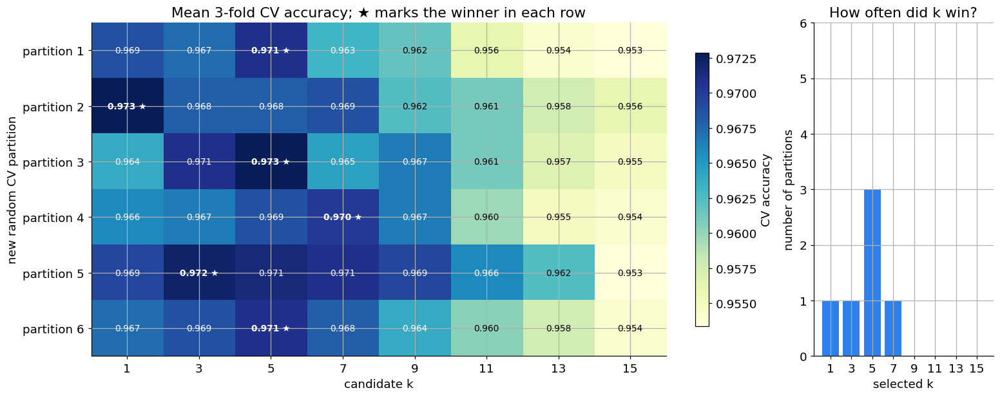

,partition,k,CV accuracy
0,1,5,0.971
1,2,1,0.973
2,3,5,0.973
3,4,7,0.970
4,5,3,0.972
5,6,5,0.971


In [15]:
partition_records = []
partition_seeds = [11, 22, 33, 44, 55, 66]

for partition_id, partition_seed in enumerate(partition_seeds, start=1):
    repeated_partition = StratifiedKFold(
        n_splits=3,
        shuffle=True,
        random_state=partition_seed,
    )
    for k in candidate_k:
        model = Pipeline(
            [
                ("scale", StandardScaler()),
                ("knn", KNeighborsClassifier(n_neighbors=k)),
            ]
        )
        score = cross_val_score(
            model,
            X_dev,
            y_dev,
            cv=repeated_partition,
            scoring="accuracy",
            n_jobs=-1,
        ).mean()
        partition_records.append(
            {
                "partition": partition_id,
                "k": k,
                "CV accuracy": score,
            }
        )

partition_scores = pd.DataFrame(partition_records)
best_per_partition = (
    partition_scores.sort_values(["partition", "CV accuracy", "k"], ascending=[True, False, True])
    .groupby("partition", as_index=False)
    .first()
)
heatmap_data = partition_scores.pivot(index="partition", columns="k", values="CV accuracy")

fig, (ax_heatmap, ax_counts) = plt.subplots(
    1,
    2,
    figsize=(14, 5.5),
    gridspec_kw={"width_ratios": [3.2, 1]},
    constrained_layout=True,
)
image = ax_heatmap.imshow(heatmap_data, cmap="YlGnBu", aspect="auto")
ax_heatmap.set(
    xticks=np.arange(len(candidate_k)),
    xticklabels=candidate_k,
    yticks=np.arange(len(partition_seeds)),
    yticklabels=[f"partition {i}" for i in range(1, len(partition_seeds) + 1)],
    xlabel="candidate k",
    ylabel="new random CV partition",
    title="Mean 3-fold CV accuracy; ★ marks the winner in each row",
)
for row_index, partition_id in enumerate(heatmap_data.index):
    winning_k = int(best_per_partition.loc[best_per_partition.partition == partition_id, "k"].iloc[0])
    for column_index, k in enumerate(heatmap_data.columns):
        value = heatmap_data.loc[partition_id, k]
        marker = " ★" if k == winning_k else ""
        text_color = "white" if image.norm(value) > 0.48 else "black"
        ax_heatmap.text(
            column_index,
            row_index,
            f"{value:.3f}{marker}",
            ha="center",
            va="center",
            fontsize=9,
            color=text_color,
            weight="bold" if k == winning_k else "normal",
        )
fig.colorbar(image, ax=ax_heatmap, shrink=0.82, label="CV accuracy")

selection_counts = best_per_partition.k.value_counts().reindex(candidate_k, fill_value=0)
ax_counts.bar(selection_counts.index.astype(str), selection_counts.values, color="#2F80ED")
ax_counts.set(
    xlabel="selected k",
    ylabel="number of partitions",
    title="How often did k win?",
    ylim=(0, len(partition_seeds)),
)
plt.show()

display(best_per_partition.style.format({"CV accuracy": "{:.3f}"}))

Если звезда перескакивает между соседними `k`, а различия составляют тысячные, утверждение «ровно это `k` истинно лучше» слишком сильное. Это не ошибка cross-validation, а честная видимость неопределённости на конечной выборке.

Этот блок опционален для первого занятия. Главная обязательная мысль уже была на предыдущем графике: выбор делаем не по train и не по test.

Теперь конфигурация зафиксирована. Только сейчас открываем test.

Final test accuracy (opened once): 0.967


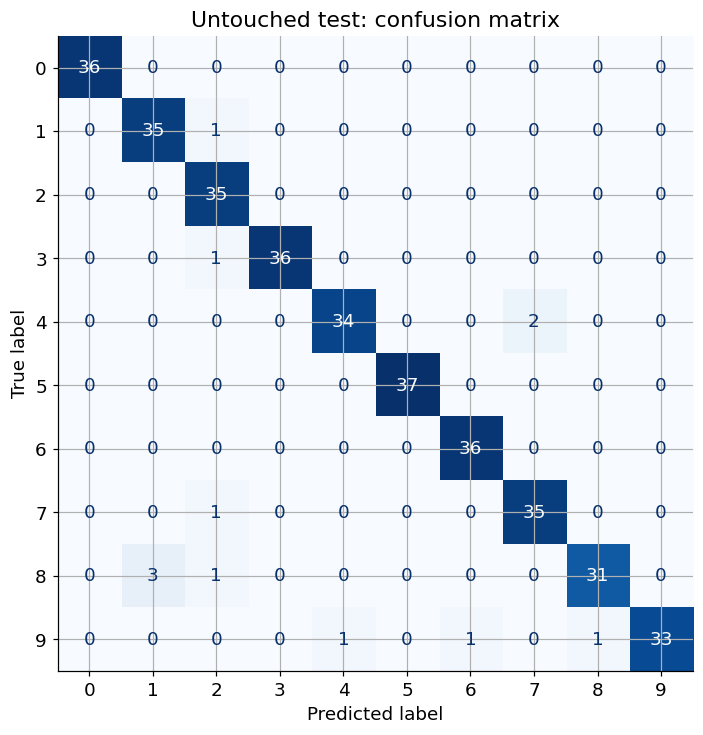

In [16]:
final_model = search.best_estimator_
test_predictions = final_model.predict(X_test)
final_test_accuracy = accuracy_score(y_test, test_predictions)

print(f"Final test accuracy (opened once): {final_test_accuracy:.3f}")

assert final_test_accuracy > 0.90

fig, ax = plt.subplots(figsize=(7.5, 7.5))
ConfusionMatrixDisplay.from_predictions(
    y_test,
    test_predictions,
    cmap="Blues",
    colorbar=False,
    ax=ax,
)
ax.set_title("Untouched test: confusion matrix")
plt.show()

## 5. Leakage: высокий score может быть плохой новостью

### 5.1. Почти одинаковые снимки одной цифры

Возьмём по **два разных исходных изображения** каждой цифры. Для каждого исходника создадим пять почти одинаковых версий с небольшим шумом. Все версии одного исходника имеют общий `group_id`.

Две проверки отвечают на разные вопросы:

- **нечестная по строкам:** четыре версии каждого исходника находятся в train, пятая версия того же исходника — в validation;
- **честная по группам:** все версии первого исходника цифры находятся в train, все версии другого исходника — в validation.

**До запуска:** в каком случае 1-NN узнаёт конкретную картинку, а не учится распознавать цифру на новом изображении?

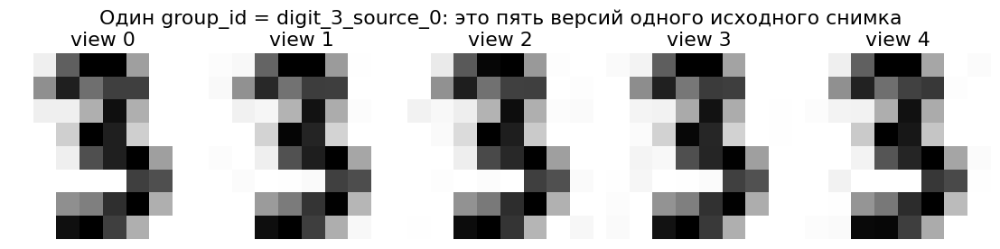

,scheme,what validation contains,validation accuracy
0,row split — same group on both sides,another view of an already seen source,1.00
1,group split — source images never cross,a genuinely different source image,0.80


In [17]:
copies_rng = np.random.default_rng(SEED)
digit_views = []
view_metadata = []

for digit in range(10):
    two_sources = np.flatnonzero(y_dev == digit)[:2]
    for source_slot, source_index in enumerate(two_sources):
        group_id = f"digit_{digit}_source_{source_slot}"
        base_image = X_dev[source_index]
        for view_id in range(5):
            noise = np.zeros_like(base_image) if view_id == 0 else copies_rng.normal(0, 0.30, size=base_image.shape)
            digit_views.append(np.clip(base_image + noise, 0, 16))
            view_metadata.append(
                {
                    "digit": digit,
                    "source_slot": source_slot,
                    "group_id": group_id,
                    "view_id": view_id,
                }
            )

X_views = np.asarray(digit_views)
views = pd.DataFrame(view_metadata)

example_indices = views.index[views.group_id == "digit_3_source_0"]
fig, axes = plt.subplots(1, 5, figsize=(10, 2.4), constrained_layout=True)
for ax, item_index in zip(axes, example_indices):
    ax.imshow(X_views[item_index].reshape(8, 8), cmap="gray_r", vmin=0, vmax=16)
    ax.set_title(f"view {views.loc[item_index, 'view_id']}")
    ax.axis("off")
fig.suptitle("Один group_id = digit_3_source_0: это пять версий одного исходного снимка")
plt.show()

def score_digit_views(train_mask, validation_mask):
    model = KNeighborsClassifier(n_neighbors=1)
    model.fit(X_views[train_mask], views.loc[train_mask, "digit"])
    return model.score(X_views[validation_mask], views.loc[validation_mask, "digit"])

leaky_train_mask = views.view_id < 4
leaky_validation_mask = views.view_id == 4
grouped_train_mask = views.source_slot == 0
grouped_validation_mask = views.source_slot == 1

leakage_scores = pd.DataFrame(
    [
        (
            "row split — same group on both sides",
            "another view of an already seen source",
            score_digit_views(leaky_train_mask, leaky_validation_mask),
        ),
        (
            "group split — source images never cross",
            "a genuinely different source image",
            score_digit_views(grouped_train_mask, grouped_validation_mask),
        ),
    ],
    columns=["scheme", "what validation contains", "validation accuracy"],
)
display(leakage_scores.style.format({"validation accuracy": "{:.2f}"}))

assert leakage_scores.loc[0, "validation accuracy"] == 1.0
assert leakage_scores.loc[0, "validation accuracy"] > leakage_scores.loc[1, "validation accuracy"]

def one_nn_score(train_frame, val_frame, feature):
    model = KNeighborsClassifier(n_neighbors=1)
    model.fit(train_frame[[feature]], train_frame.label)
    return model.score(val_frame[[feature]], val_frame.label)

В первой строке validation проверяет почти копирование: рядом уже лежит почти тот же массив пикселей. Во второй строке validation действительно проверяет перенос на **другой исходный снимок**. Поэтому высокий результат первой схемы не отвечает на нужный вопрос.

Практические `group_id`: пациент, пользователь, устройство, исходное изображение до аугментаций, один ролик и его кадры. Объекты одной группы нельзя независимо разбрасывать между train и validation.

### 5.2. Будущее попало в обучение

В момент `T5` режим меняется с A на B. Сравним случайное разбиение с честным прогнозом будущего по прошлому.

In [18]:
temporal = pd.DataFrame(
    [(f"T{t}", t, "A" if t <= 4 else "B") for t in range(1, 9)],
    columns=["id", "time", "label"],
)

random_train = temporal.query("time in [1, 3, 5, 7]")
random_val = temporal.query("time in [2, 4, 6, 8]")
past = temporal.query("time <= 4")
future = temporal.query("time >= 5")

temporal_scores = pd.DataFrame(
    [
        ("random split (uses future neighbors)", one_nn_score(random_train, random_val, feature="time")),
        ("time split (past → future)", one_nn_score(past, future, feature="time")),
    ],
    columns=["scheme", "validation accuracy"],
)
display(temporal)
display(temporal_scores.style.format({"validation accuracy": "{:.2f}"}))

assert np.allclose(temporal_scores["validation accuracy"], [1.0, 0.0])

,id,time,label
0,T1,1,A
1,T2,2,A
2,T3,3,A
3,T4,4,A
4,T5,5,B
5,T6,6,B
6,T7,7,B
7,T8,8,B


,scheme,validation accuracy
0,random split (uses future neighbors),1.00
1,time split (past → future),0.00


Низкий score честного time split не означает, что разбиение «мешает модели». Он показывает реальную задачу: в прошлом не было примеров нового режима.

**Контрольный список перед оценкой:**

1. Какая информация реально доступна в момент предсказания?
2. Есть ли версии одного объекта, группы или соседние моменты времени?
3. Все ли шаги preprocessing обучаются только внутри train/fold?
4. Не использовали ли мы test для выбора решения?

## Бонус A. YSDA cross-validation riddle

Сгенерируем признаки и случайные метки, между которыми **нет настоящей связи**. Затем выберем признаки, наиболее коррелирующие с target.

Вариант 1 делает feature selection заранее по всему датасету. Вариант 2 помещает selection внутрь `Pipeline`, поэтому на каждом fold он видит только fold-train.

**До запуска:** в каком варианте CV-score окажется подозрительно высоким?

In [19]:
noise_rng = np.random.default_rng(SEED)
X_noise = noise_rng.normal(size=(120, 1500))
y_noise = noise_rng.integers(0, 2, size=120)
riddle_cv = StratifiedKFold(n_splits=6, shuffle=True, random_state=SEED)

selector = SelectKBest(score_func=f_classif, k=100)
X_selected_too_early = selector.fit_transform(X_noise, y_noise)
leaky_scores = cross_val_score(
    LinearSVC(dual="auto", max_iter=5000),
    X_selected_too_early,
    y_noise,
    cv=riddle_cv,
    scoring="accuracy",
)

honest_pipeline = Pipeline(
    [
        ("select", SelectKBest(score_func=f_classif, k=100)),
        ("model", LinearSVC(dual="auto", max_iter=5000)),
    ]
)
honest_scores = cross_val_score(
    honest_pipeline,
    X_noise,
    y_noise,
    cv=riddle_cv,
    scoring="accuracy",
)

riddle_results = pd.DataFrame(
    {
        "fold": np.arange(1, len(leaky_scores) + 1),
        "selection before CV (leakage)": leaky_scores,
        "selection inside pipeline": honest_scores,
    }
)
display(riddle_results.style.format(precision=2))
print(f"Leaky mean:  {leaky_scores.mean():.3f}")
print(f"Honest mean: {honest_scores.mean():.3f}  (chance level is about 0.5)")

assert leaky_scores.mean() > 0.75
assert abs(honest_scores.mean() - 0.5) < 0.20

,fold,selection before CV (leakage),selection inside pipeline
0,1,0.95,0.45
1,2,0.90,0.55
2,3,0.95,0.35
3,4,0.90,0.35
4,5,0.85,0.55
5,6,0.90,0.50


Leaky mean:  0.908
Honest mean: 0.458  (chance level is about 0.5)


**Почему это утечка:** target всех будущих validation folds уже участвовал в выборе 100 «удачных» признаков. `cross_val_score` честно переобучает только классификатор, но не может отменить информацию, внесённую заранее.

Pipeline — не просто удобный синтаксис. Он задаёт границу того, что обязано переобучаться внутри каждого fold.

## Бонус B. Проклятие размерности

В большой размерности расстояния до «ближайшего» и «далёкого» объекта становятся менее контрастными. Посмотрим на отношение

$$rac{d_{max}-d_{min}}{d_{min}}.$$

Чем оно меньше, тем труднее отличить действительно близкого соседа по одной только евклидовой геометрии.

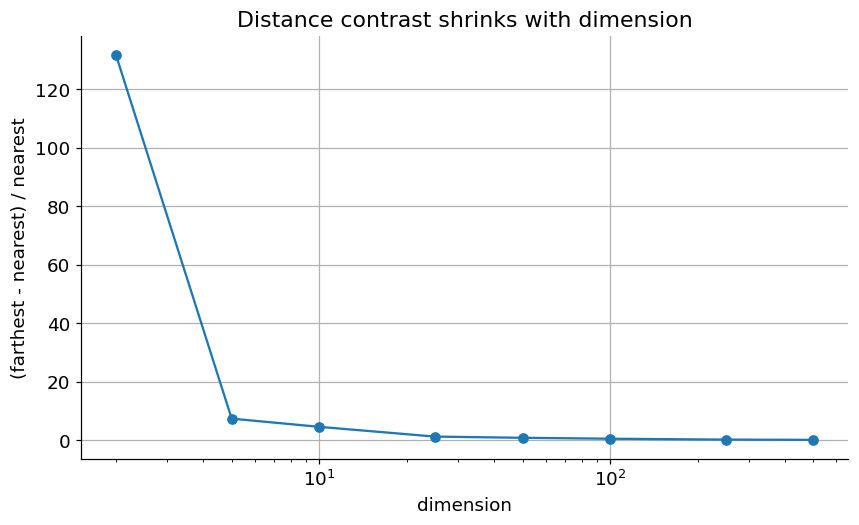

,dimension,nearest,farthest,relative contrast
0,2,0.03,4.34,131.69
1,5,0.74,6.20,7.44
2,10,1.48,8.31,4.64
3,25,4.73,10.92,1.31
4,50,6.95,13.16,0.89
5,100,10.97,17.33,0.58
6,250,19.54,24.92,0.28
7,500,28.60,34.20,0.20


In [20]:
dimension_rows = []
dim_rng = np.random.default_rng(SEED)

for dimension in [2, 5, 10, 25, 50, 100, 250, 500]:
    points = dim_rng.normal(size=(1000, dimension))
    query = dim_rng.normal(size=dimension)
    distances = np.linalg.norm(points - query, axis=1)
    dimension_rows.append(
        {
            "dimension": dimension,
            "nearest": distances.min(),
            "farthest": distances.max(),
            "relative contrast": (distances.max() - distances.min()) / distances.min(),
        }
    )

dimension_results = pd.DataFrame(dimension_rows)
ax = dimension_results.plot(
    x="dimension",
    y="relative contrast",
    marker="o",
    logx=True,
    legend=False,
    figsize=(9, 5),
)
ax.set(ylabel="(farthest - nearest) / nearest", title="Distance contrast shrinks with dimension")
plt.show()
display(dimension_results.style.format({"nearest": "{:.2f}", "farthest": "{:.2f}", "relative contrast": "{:.2f}"}))

## Итоги и exit ticket

kNN — короткий алгоритм, но длинный список содержательных решений:

- какие признаки сравнивать;
- как их масштабировать;
- что считать расстоянием;
- сколько соседей брать и как взвешивать их ответы;
- каким разбиением имитировать настоящее будущее применение;
- насколько вывод зависит от одной точки или одного split.

Закончите **одну** фразу:

1. «Перед запуском kNN я обязан спросить про данные: …»
2. «Validation отличается от test тем, что …»
3. «Высокий CV-score может быть обманчивым, если …»
4. «Расстояние является содержательным выбором, потому что …»

## Происхождение примеров

Ноутбук собран как обновлённая линия первого занятия курса:

- геометрия kNN и границы решений — из семинарских наработок `ml-course`, включая ветки `24f_ysda` и `25f_mipt`;
- постановочные вопросы и Iris/CV-акцент — из `25s_msai`;
- идея финального примера на рукописных цифрах — из задания `classic_knn`, основанного на Stanford CS231n;
- feature-selection riddle — из материалов Yandex School of Data Analysis / MLatImperial;
- точки, выброс, масштаб, group/time leakage и сценарий «сначала прогноз» — из подготовки сегодняшней лекции.

Все данные, нужные для основного пути, встроены в notebook или входят в scikit-learn. Сетевой доступ не требуется.